El objetivo de este jupyter notebook es mostrar todo lo necesario para poder analizar y comprender el proceso realizado para la obtención de los resultados mostrados en el TFG "Interpretability of classification models". Las principales conslusiones se muestran en la memoria del TFG y este archivo pretende servir para entender y contrastar el origen de estas conclusiones. Sin embargo, se han ido añadiendo unos breves análisis de los resultados tras las ejecuciones y se muestran al final las principales conclusiones obtenidas.

**Table of contents**<a id='toc0_'></a>    
- [Explicaciones previas](#toc1_)    
- [Librerias](#toc2_)    
- [Declaración o carga de algunas variables](#toc3_)    
- [Recibos](#toc4_)    
  - [Previsualización de datos](#toc4_1_)    
  - [Feature Importance](#toc4_2_)    
  - [Permutation Feature Importance](#toc4_3_)    
  - [PDP](#toc4_4_)    
  - [SHAP](#toc4_5_)    
    - [Bar Plot](#toc4_5_1_)    
    - [Summary Plot](#toc4_5_2_)    
    - [Force Plots](#toc4_5_3_)    
    - [Dependence Plots](#toc4_5_4_)    
- [Tarjeta](#toc5_)    
  - [Previsualización de datos](#toc5_1_)    
  - [Feature Importance](#toc5_2_)    
  - [Permutation Feature Importance](#toc5_3_)    
  - [PDP](#toc5_4_)    
  - [SHAP](#toc5_5_)    
    - [Bar Plot](#toc5_5_1_)    
    - [Summary Plot](#toc5_5_2_)    
    - [Force Plots](#toc5_5_3_)    
    - [Dependence Plots](#toc5_5_4_)    
- [Impuestos](#toc6_)    
  - [Previsualización de datos](#toc6_1_)    
  - [Feature Importance](#toc6_2_)    
  - [Permutation Feature Importance](#toc6_3_)    
  - [PDP](#toc6_4_)    
  - [SHAP](#toc6_5_)    
    - [Bar Plot](#toc6_5_1_)    
    - [Summary Plots](#toc6_5_2_)    
    - [Force Plots](#toc6_5_3_)    
    - [Dependence Plots](#toc6_5_4_)    
- [Resultados Interpretabilidad](#toc7_)    
  - [Interpretabilidad Recibos](#toc7_1_)    
  - [Interpretabilidad Tarjetas](#toc7_2_)    
  - [Interpretabilidad Impuestos](#toc7_3_)    
- [Conclusiones](#toc8_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Explicaciones previas](#toc0_)

En el archivo [Anexo](Anexo.ipynb) muestro una serie de explicaciones previas que pueden ser útiles para esta parte práctica y que no han podido ser tratadas por razones de extensión en la memoria del TFG.

# <a id='toc2_'></a>[Librerias](#toc0_)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import dill
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

In [3]:
from sklearn.ensemble         import RandomForestRegressor
from sklearn.model_selection  import train_test_split
from sklearn.inspection       import permutation_importance
from sklearn.inspection import PartialDependenceDisplay
from alepython import ale_plot
import shap

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [4]:
np.random.seed(42)

# <a id='toc3_'></a>[Declaración o carga de algunas variables](#toc0_)

In [5]:
all_models = [
    'recibos',
    'tarj',
    'impuestos', 
    'recibos+tarj',
    'recibos+impuestos',
    'tarj+impuestos',
    'recibos+tarj+impuestos',
]
models_to_run = all_models[0:3]

In [6]:
res = {}
with open(f"res_final_mod/res_recibos.pkl", "rb") as dill_file:
    res['recibos'] = dill.load(dill_file)
with open(f"res_final_mod/res_impuestos.pkl", "rb") as dill_file:
    res['impuestos'] = dill.load(dill_file)
with open(f"res_final_mod/res_tarj.pkl", "rb") as dill_file:
    res['tarj'] = dill.load(dill_file)

Trying to unpickle estimator DecisionTreeRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator DecisionTreeRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.4.2 when using version 1.3.2. This might lead to bre

In [7]:
res['recibos'].keys()

dict_keys(['model', 'params', 'score', 'res_df', 'X_train', 'y_train', 'X_test', 'y_test', 'imp_feat', 'imp_feat_perm'])

# <a id='toc4_'></a>[Recibos](#toc0_)

In [8]:
X_train = res['recibos']['X_train']
y_train = res['recibos']['y_train']
X_test = res['recibos']['X_test']
y_test = res['recibos']['y_test']

rf = res['recibos']['model']

imp_feat = res['recibos']['imp_feat']
imp_feat_perm = res['recibos']['imp_feat_perm']


## <a id='toc4_1_'></a>[Previsualización de datos](#toc0_)

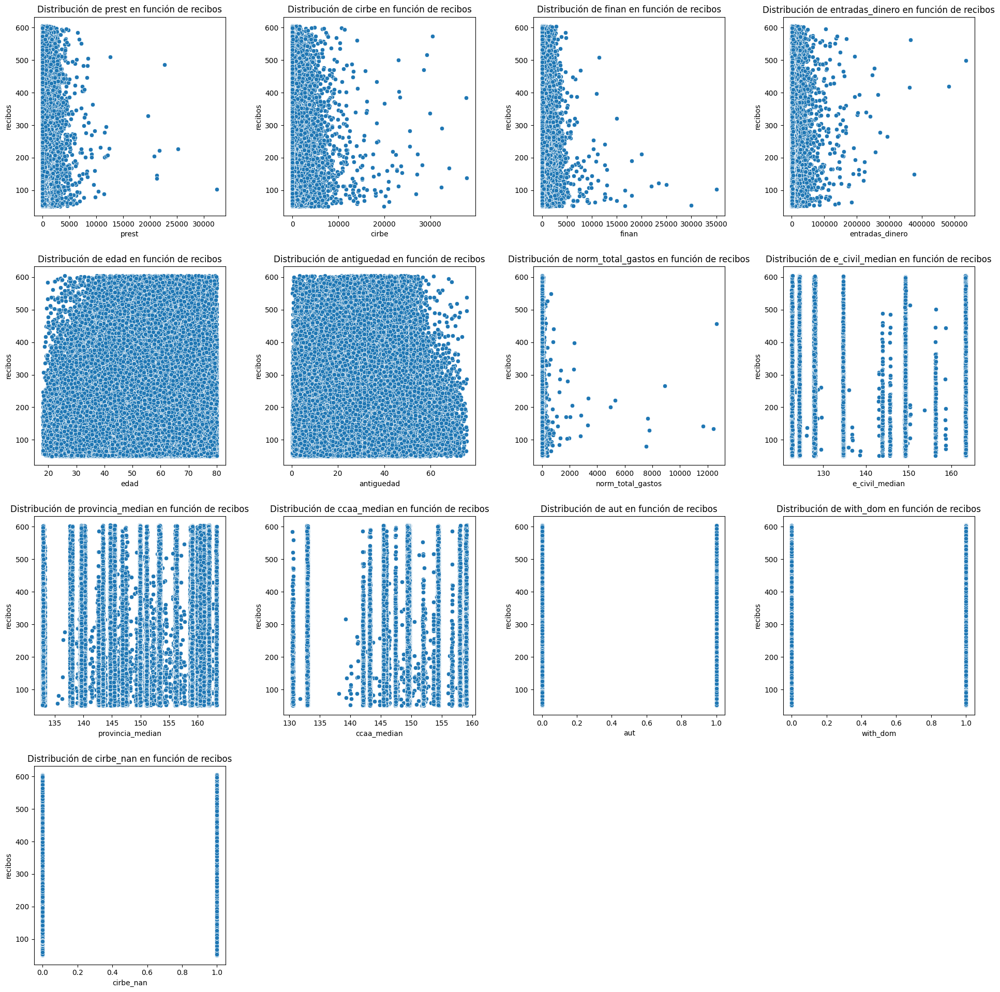

In [28]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['recibos'] = y_train
df = df_train[df_train['prest'] <= 50000]
df = df[df['cirbe'] <= 40000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 1000000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['recibos'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de recibos')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('recibos')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Poco que comentar, vemos que es un problema muy complicado pues no vemos prácticamente ninguna relación entre las variables y el target a predecir.

## <a id='toc4_2_'></a>[Feature Importance](#toc0_)

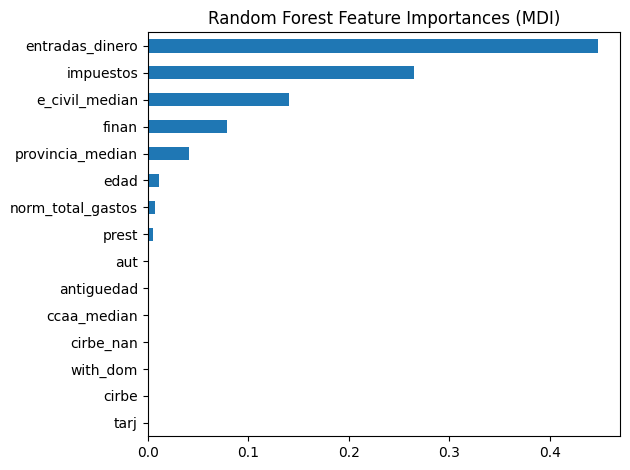

In [29]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

De aquí podemos observar que el modelo predice principalmente en función de las entradas de dinero, los impuestos, el estado civil, la financiación y la provincia.

## <a id='toc4_3_'></a>[Permutation Feature Importance](#toc0_)

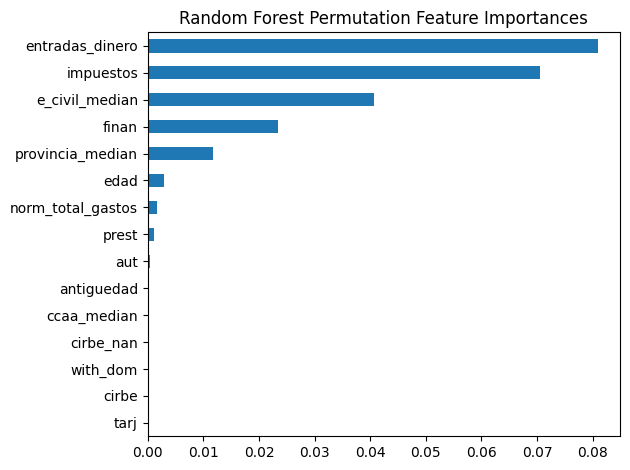

In [30]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Partimos de algo muy importante, las PFI son tan bajas que ya sabemos que el modelo se ajusta muy poco a la realidad.

Sin embargo, sí podemos afirmar algo bueno, es muy similar a las feature importance anteriores, lo que significa que el modelo predice de una manera que concuerda con la precisión de los datos. (FI muestra como predice el modelo y PFI que variables son las que afectan más a la precisión de los datos, que coincidan es una señal de que no hay overfitting y que el modelo es coherente). 

## <a id='toc4_4_'></a>[PDP](#toc0_)

In [31]:

rf.feature_names_in_

array(['prest', 'tarj', 'cirbe', 'impuestos', 'finan', 'entradas_dinero',
       'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median',
       'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'],
      dtype=object)

Variables a estudiar:

- entradas_dinero --> 5
- impuestos --> 3
- e_civil_median --> 9
- finan --> 4
- provincia_median --> 10
- edad --> 6

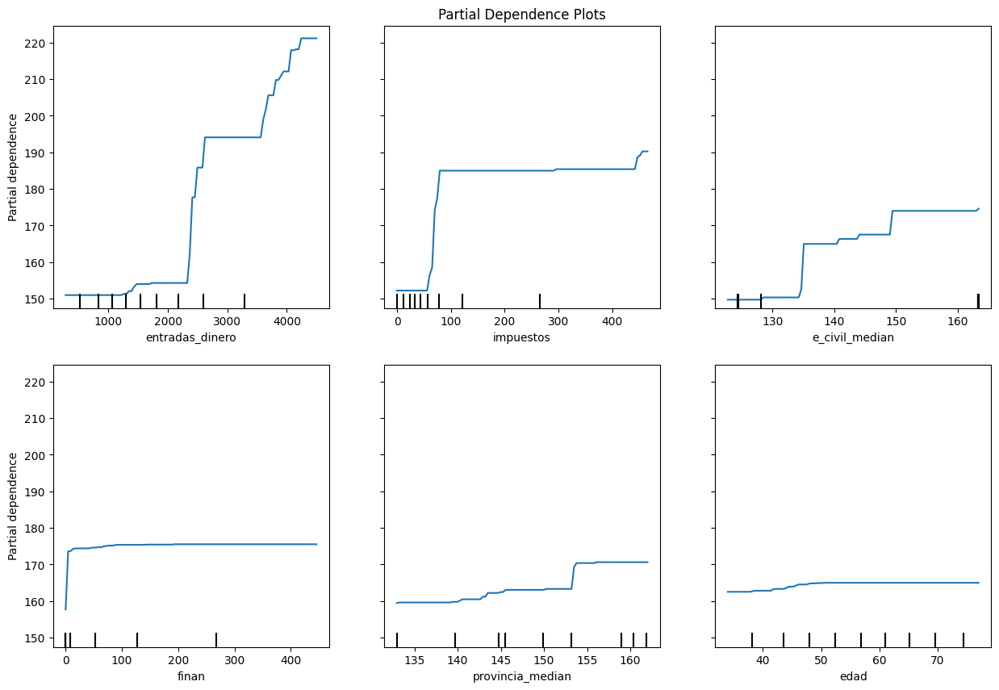

In [32]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(5, 3, 9, 4, 10, 6), # the features to plot
    #categorical_features = [13, 12, 11], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Si observamos las variables más importantes podemos intuir como las utiliza el modelo. No voy a comentar demasiado pues de esto pues SHAP es más fiable/consistente.

## <a id='toc4_5_'></a>[SHAP](#toc0_)

In [9]:
shap.initjs()

In [10]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/recibos_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/recibos_shap_values.npy', shap_values)

### <a id='toc4_5_1_'></a>[Bar Plot](#toc0_)

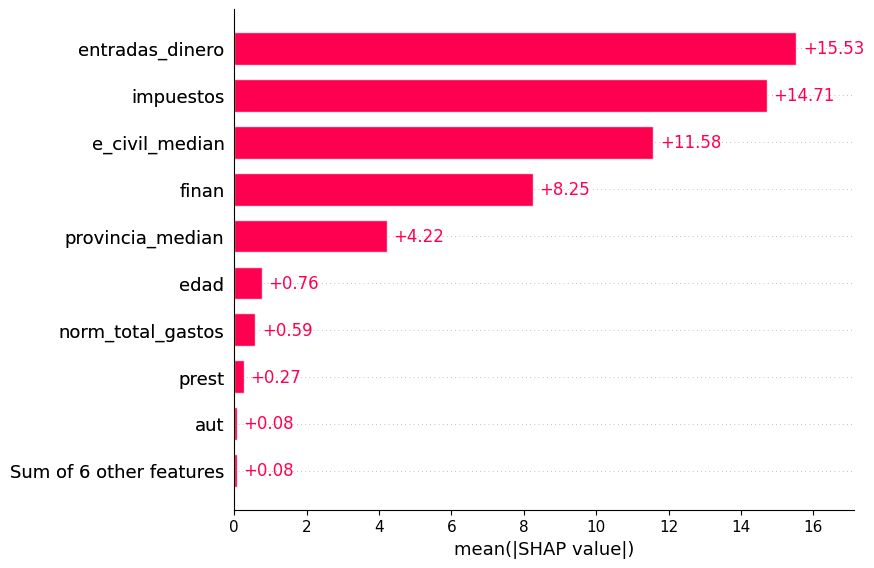

In [15]:
# Crear un objeto Explanation
shap_explanation = shap.Explanation(shap_values, base_values=explainer.expected_value, data=X_test, feature_names=X_test.columns)

# Crear el gráfico de barras
shap.plots.bar(shap_explanation)

Vemos resultados muy parecidos a los obtenidos con FI y PFI.

### <a id='toc4_5_2_'></a>[Summary Plot](#toc0_)

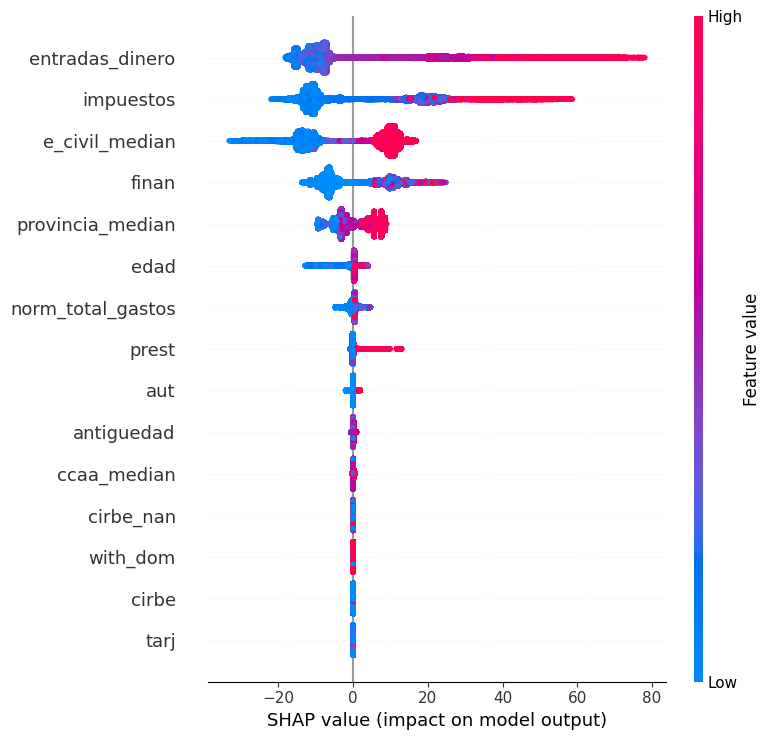

In [35]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Resumen breve, he sido más extenso en impuestos:
- La entrada de dinero es lo que más afecta, hay un grupo denso de valores bajos y luego el modelo usa una relación que podría ser similar a una relación directa lineal.
- Los impuestos parece que también afectan de manera similar.
- El estado civil se asemeja más a un tipo categórico.
- Los efectos de la financiación son similiares a los de la entrada de dinero y pero con mucha mayor confusión.
- La provincia se asemeja más a un tipo categórico.

En general vamos a ver con las gráficas de cada variable específica que están actuando como disparadores, similares a la función de activación de una red neuronal o a la función logística.

### <a id='toc4_5_3_'></a>[Force Plots](#toc0_)

In [15]:
import shap

# Suponiendo que ya tienes definidos explainer, shap_values y X_test

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

In [16]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/recibos_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

En el html de este enlace se puede observar el gráfico resumen de los force plots.

[Force Plot Recibos](SHAP/recibos_force_plot.html)

Adjunto a continuación algunas captura para analizar algunas ideas.

![Image](Imagenes/Recibos/recibos_SHAP_fp_outVls.png)

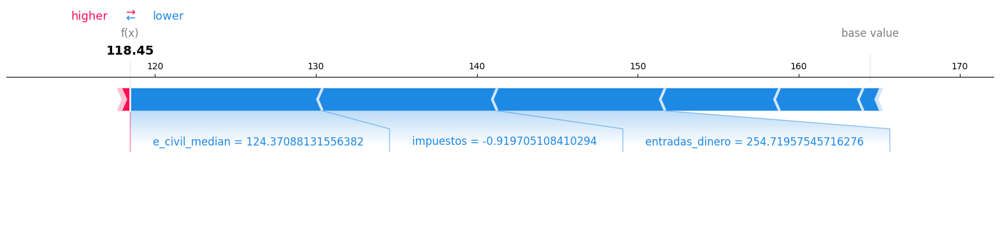

In [26]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[796]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

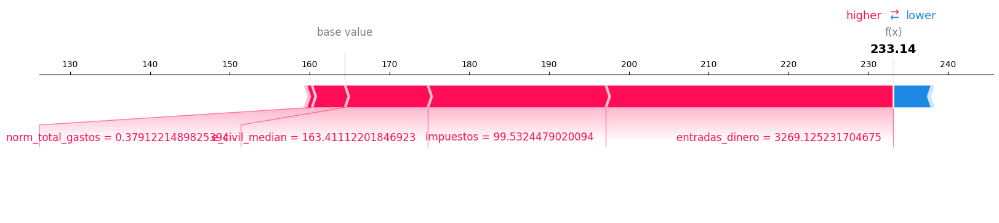

In [27]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[668]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

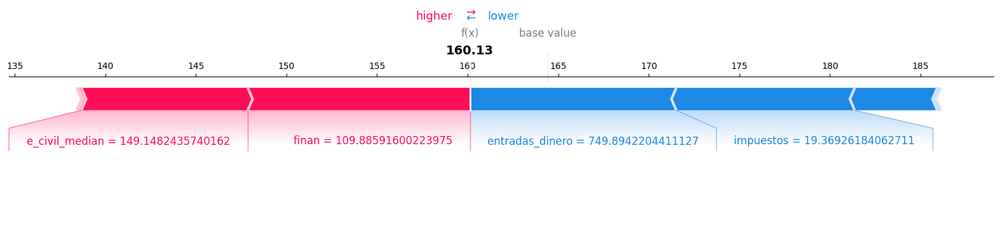

In [28]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[590]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

Como comentario general de esto vemos que los SHAP values tienen un valor base de unos 164 y el rango de predicciones está aproximadamente entre [124,280]. Estos gráficos de fuerza nos sirven para ejemplificar lo ya comentado, por ejemplo, el aumento en la cantidad de dinero entrante o impuestos aumenta la predicción.

### <a id='toc4_5_4_'></a>[Dependence Plots](#toc0_)

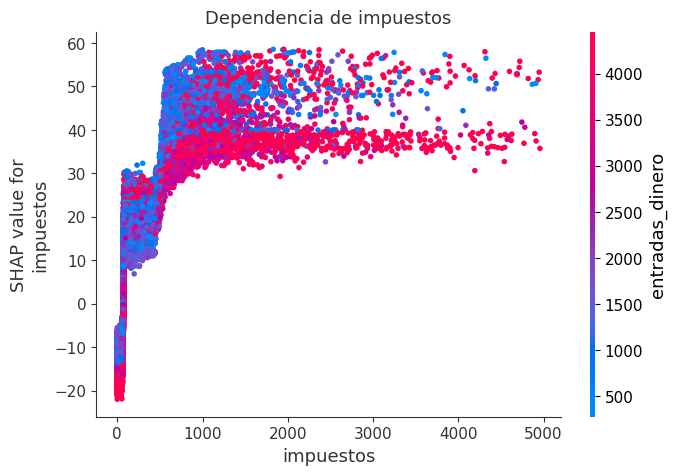

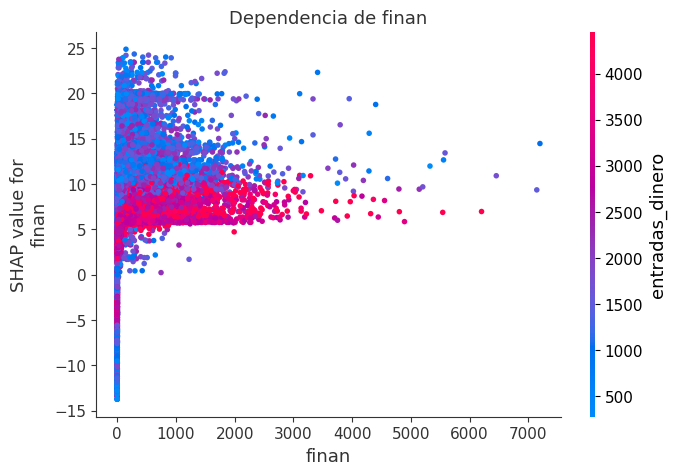

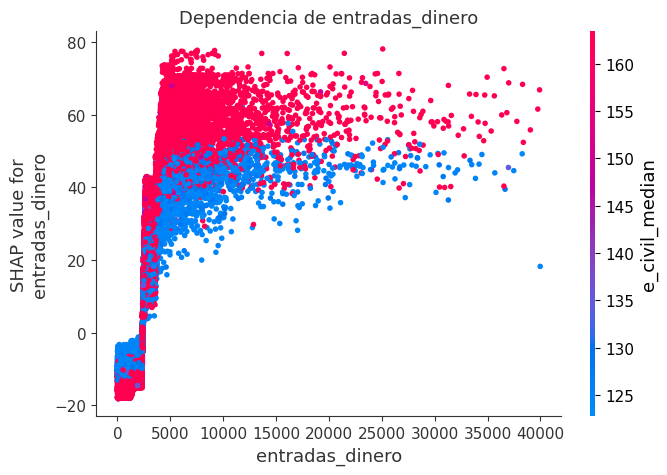

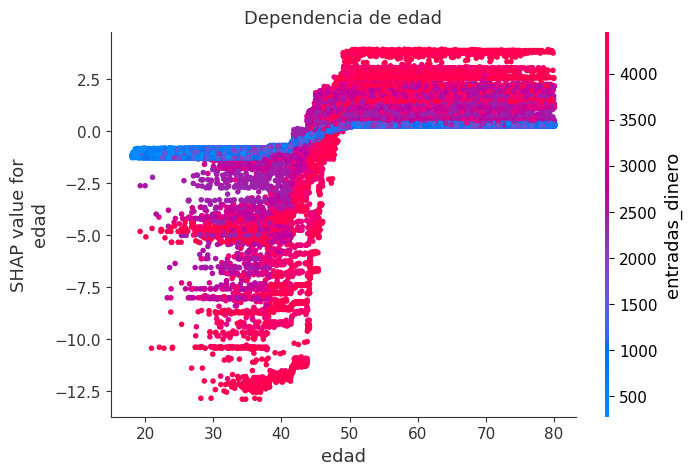

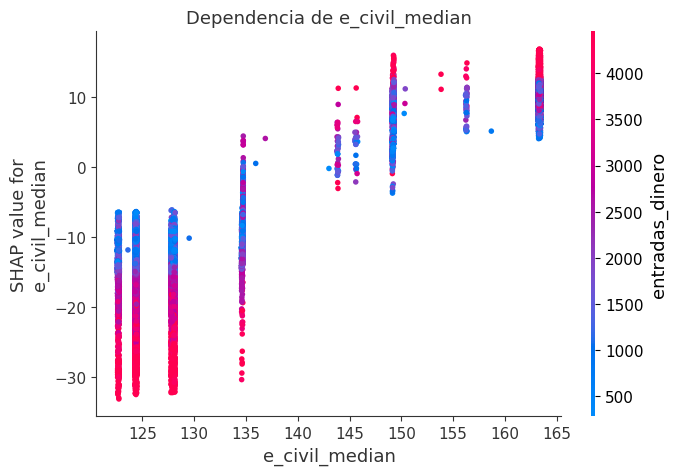

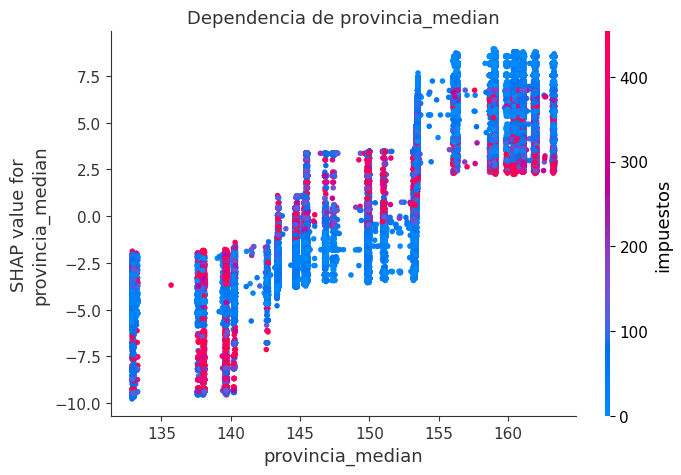

In [67]:
# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['impuestos']<5000]
X_clean = X_clean[X_clean['finan']<7500]
X_clean = X_clean[X_clean['entradas_dinero']<40000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['entradas_dinero','impuestos','e_civil_median','finan','provincia_median','edad']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

**NOTA**: he quitado valores demasiado altos para poder observar mejor la distribución de la gran mayoría de puntos. Abajo muestro aún así los gráficos con todos los valores para ser más consistente con la explicación.

Como ya he comentado, sin duda lo más importante es observar que las distribuciones de los SHAP values se asemejan a las gráficas de disparadores o la función logistic. Es decir, el modelo le esta dando un rango a cada variable sobre el posible aumento o disminución de cada variable. A los impuestos por ejemplo les da el rango [-25,75], cambia muy rápidamente su valor (entre 0 y 1000 EUR) y después se mantiene casi constante incluso para valores enormemente altos como se muestra en las gráficas de abajo. Sucede algo similar para el resto de variables.

Otro aspecto importante a observar son las relaciones entre algunas variables, los gráficos arriba mostrados permiten ver como la entrada de dinero afecta al resto de características. Aunque hay bastante confusión en esta relación me sorprende mucho que, aunque el aumento de la entrada de dinero aumenta la cantidad de recibos, en relación con otras variables hace que el valor límite superior tienda a ser algo menor.

Finalmente, como curiosidad, podemos ver muy clara la relación que tiene el modelo con la edad y le entrada de dinero combinada. Básicamente el modelo predice que entre los 40 y los hay un aumento de la cantidad de los recibos, y que este aumento es mayor cuanto mayor es la entrada de dinero. La cantidad que afecta realmente es bastante baja, pero es interesante.

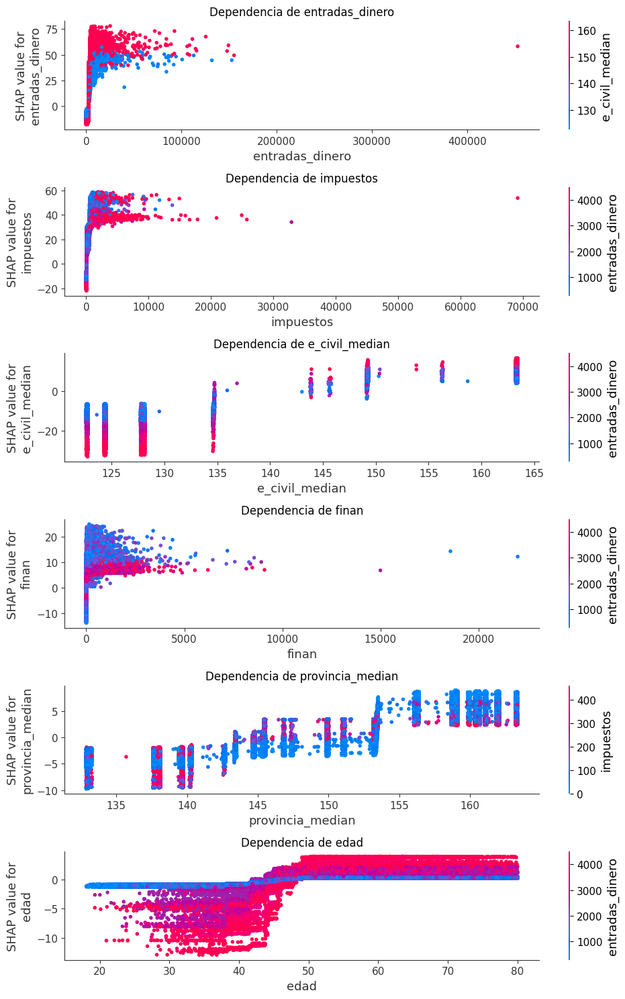

In [11]:
# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Definir las características a graficar
feature_names = rf.feature_names_in_
feature_list = ['entradas_dinero', 'impuestos', 'e_civil_median', 'finan', 'provincia_median', 'edad']

# Crear subplots con tamaño más pequeño
num_features = len(feature_list)
fig, axes = plt.subplots(nrows=num_features, ncols=1, figsize=(10, num_features * 2.5))

# Visualizar gráficos de dependencia para cada característica
for ax, feature_name in zip(axes, feature_list):
    feature_index = feature_names.tolist().index(feature_name)
    shap.dependence_plot(
        feature_index, 
        shap_values, 
        features=X_test, 
        feature_names=feature_names,
        ax=ax,
        show=False
    )
    ax.set_title(f"Dependencia de {feature_name}")

plt.tight_layout()
plt.show()

# <a id='toc5_'></a>[Tarjeta](#toc0_)

In [16]:
X_train = res['tarj']['X_train']
y_train = res['tarj']['y_train']
X_test = res['tarj']['X_test']
y_test = res['tarj']['y_test']

rf = res['tarj']['model']

imp_feat = res['tarj']['imp_feat']
imp_feat_perm = res['tarj']['imp_feat_perm']


## <a id='toc5_1_'></a>[Previsualización de datos](#toc0_)

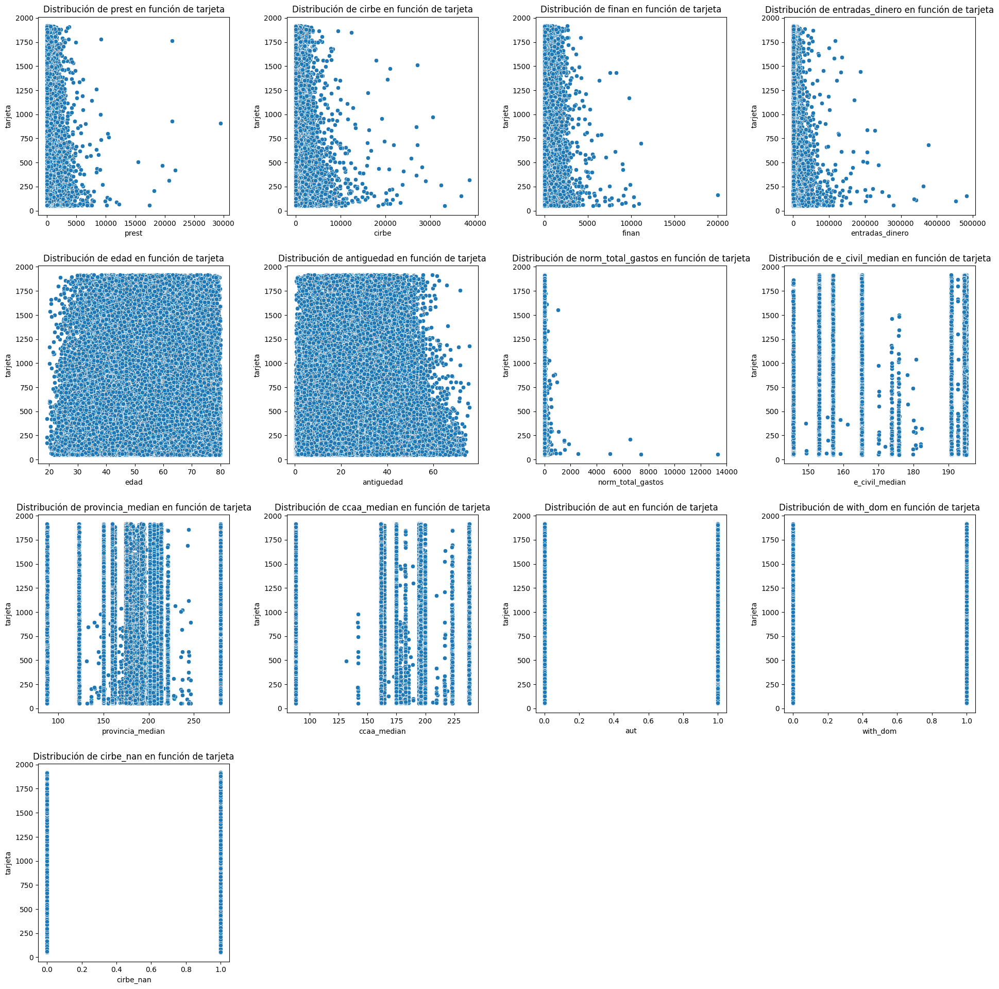

In [72]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['tarj'] = y_train
df = df_train[df_train['prest'] <= 50000]
df = df[df['cirbe'] <= 40000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 1000000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['tarj'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de tarjeta')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('tarjeta')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Igual que antes poca relación entre las variables y el target.

## <a id='toc5_2_'></a>[Feature Importance](#toc0_)

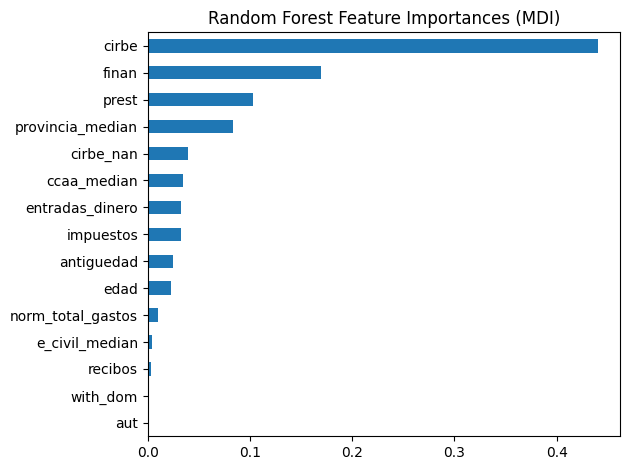

In [73]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

Este modelo tiene en cuenta más variables que el anterior.

## <a id='toc5_3_'></a>[Permutation Feature Importance](#toc0_)

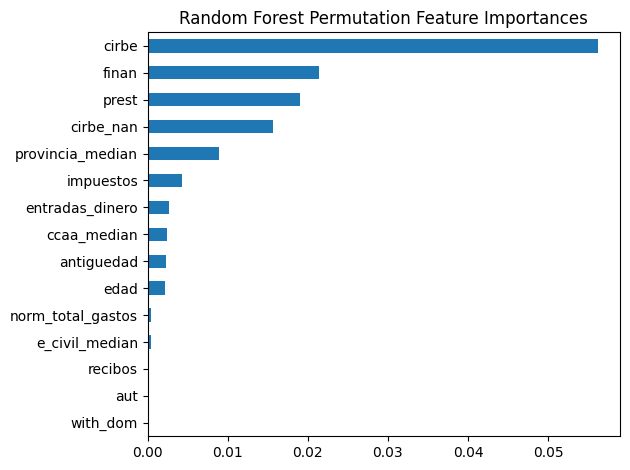

In [74]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Igual que antes, las PFI son tan bajas que ya sabemos que el modelo se ajusta muy poco a la realidad. Como ya  he comentado sí es interesante que la precisión del modelo se ve afectada por más variables.

## <a id='toc5_4_'></a>[PDP](#toc0_)

In [75]:

rf.feature_names_in_

array(['prest', 'recibos', 'cirbe', 'impuestos', 'finan',
       'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos',
       'e_civil_median', 'provincia_median', 'ccaa_median', 'aut',
       'with_dom', 'cirbe_nan'], dtype=object)

Variables a estudiar:

- cirbe --> 2
- finan --> 4
- prest --> 0
- ciber_nan --> 14
- provincia_median --> 10
- impuestos --> 3

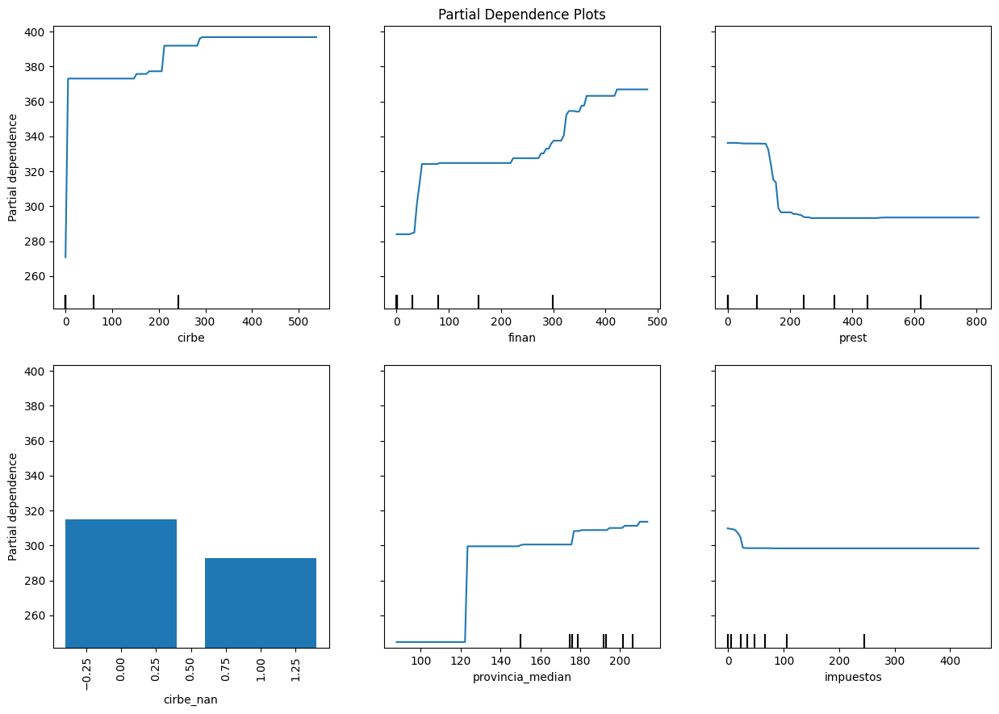

In [76]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(2, 4, 0, 14, 10, 3), # the features to plot
    categorical_features = [False]*14+[True], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Vemos como en el otro modelo la misma tendencia que antes a los escalones en los PDP.

## <a id='toc5_5_'></a>[SHAP](#toc0_)

In [17]:
shap.initjs()

In [18]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/tarj_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/tarj_shap_values.npy', shap_values)

### <a id='toc5_5_1_'></a>[Bar Plot](#toc0_)

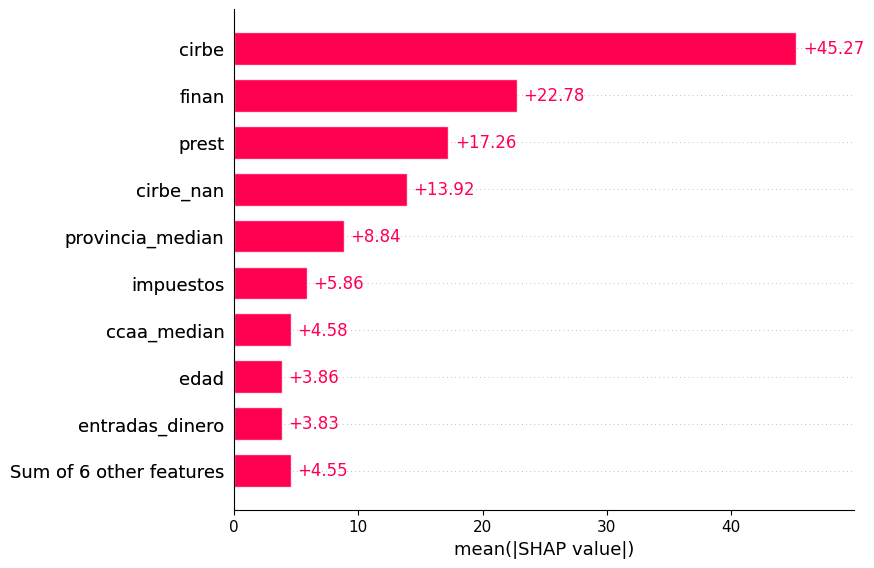

In [19]:
# Crear un objeto Explanation
shap_explanation = shap.Explanation(shap_values, base_values=explainer.expected_value, data=X_test, feature_names=X_test.columns)

# Crear el gráfico de barras
shap.plots.bar(shap_explanation)

Otra vez obtenemos resultados muy similares a los de FI y PFI.

### <a id='toc5_5_2_'></a>[Summary Plot](#toc0_)

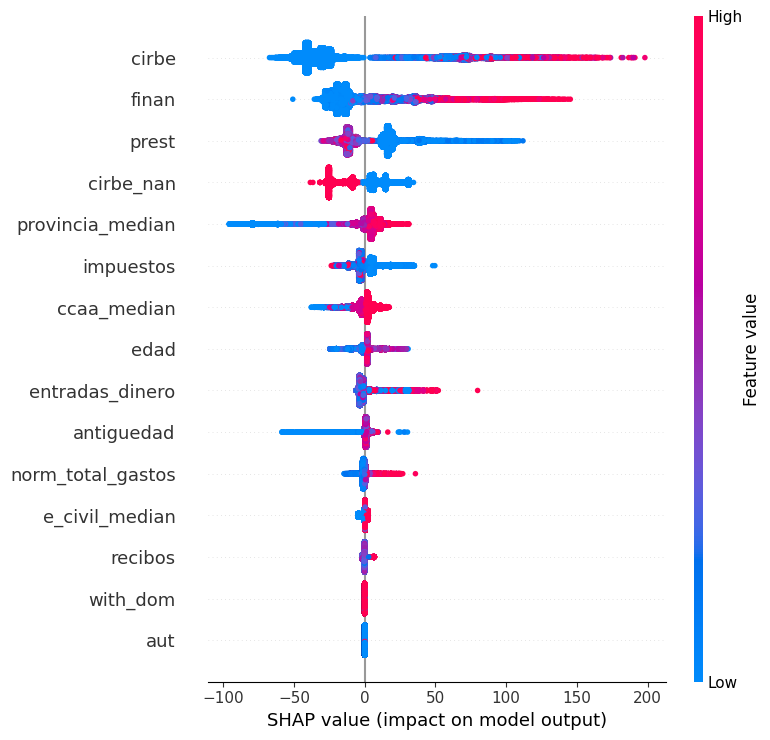

In [12]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Salvo para prest e impuestos la interpretación es sencilla. No voy a entrar en detalles en este modelo.

### <a id='toc5_5_3_'></a>[Force Plots](#toc0_)

In [13]:
#shap.force_plot(explainer.expected_value[0], shap_values, X_test)

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

In [14]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/tarj_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

En el html de este enlace se puede observar el gráfico resumen de los force plots.

[Force Plot Tarjetas](SHAP/tarj_force_plot.html)

Adjunto a continuación algunas captura para analizar algunas ideas.

![Image](Imagenes/tarj/tarj_SHAP_fp_outVls.png)

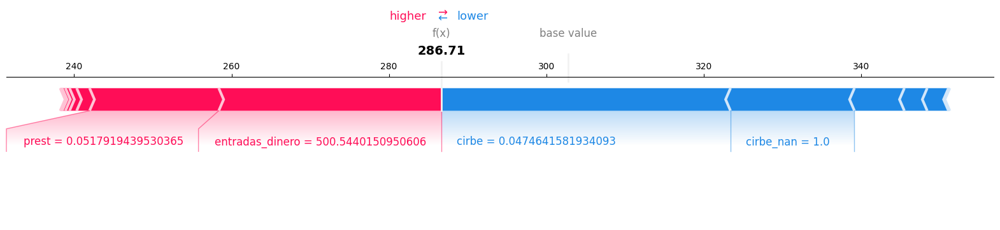

In [16]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[137]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

Como comentario general de esto vemos que los SHAP values tienen un valor base de unos 305 y el rango de predicciones está aproximadamente entre [100,600]. Podemos ver como los force plots corroboran que el informe cirbe y la entrada de dinero son variables importantes para este modelo.

### <a id='toc5_5_4_'></a>[Dependence Plots](#toc0_)

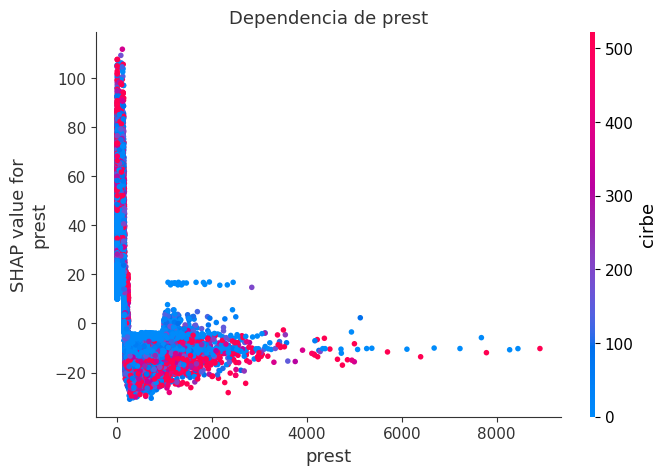

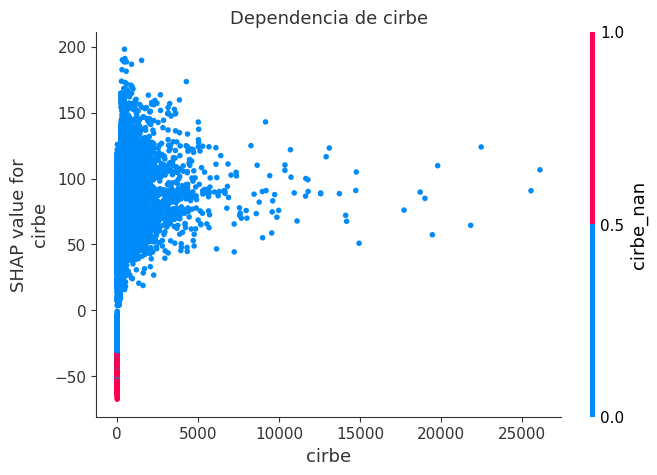

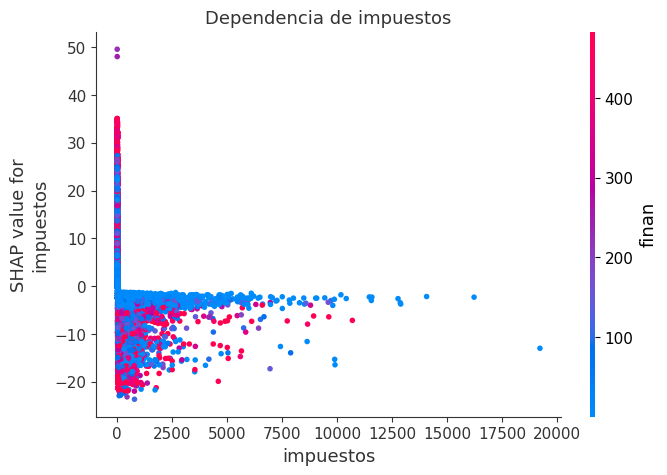

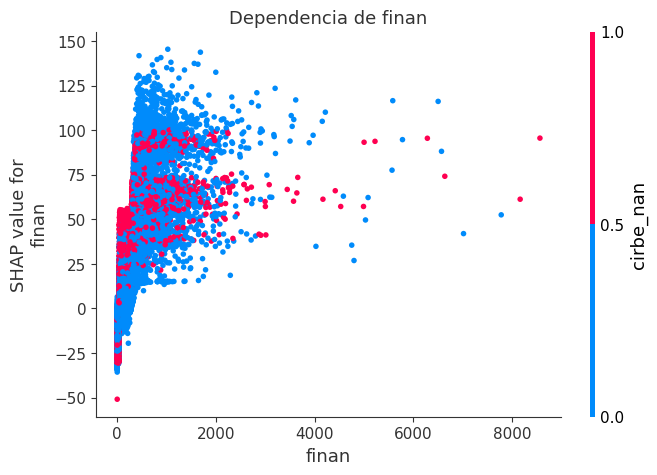

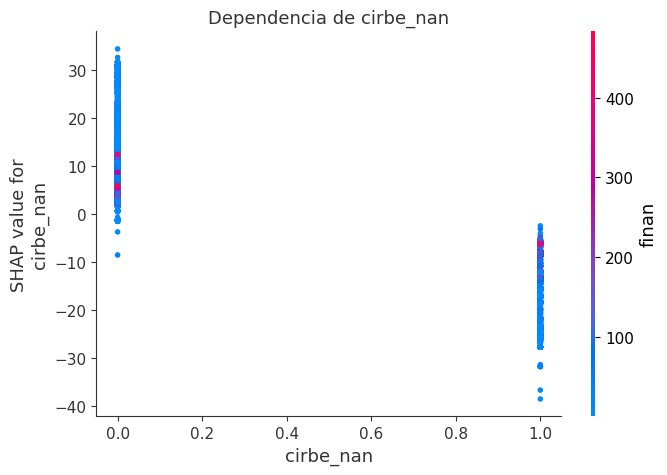

In [82]:
# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['impuestos']<20000]
X_clean = X_clean[X_clean['finan']<10000]
X_clean = X_clean[X_clean['prest']<10000]
X_clean = X_clean[X_clean['cirbe']<30000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['cirbe','finan','prest','finan','impuestos', 'cirbe_nan']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

En estos gráficos hay mucha más confusión que en los otros dos modelos, por lo que, sumado al mal resultado del modelo, no es tan interesante a la hora de sacar conclusiones.

# <a id='toc6_'></a>[Impuestos](#toc0_)

In [20]:
X_train = res['impuestos']['X_train']
y_train = res['impuestos']['y_train']
X_test = res['impuestos']['X_test']
y_test = res['impuestos']['y_test']

rf = res['impuestos']['model']

imp_feat = res['impuestos']['imp_feat']
imp_feat_perm = res['impuestos']['imp_feat_perm']


## <a id='toc6_1_'></a>[Previsualización de datos](#toc0_)

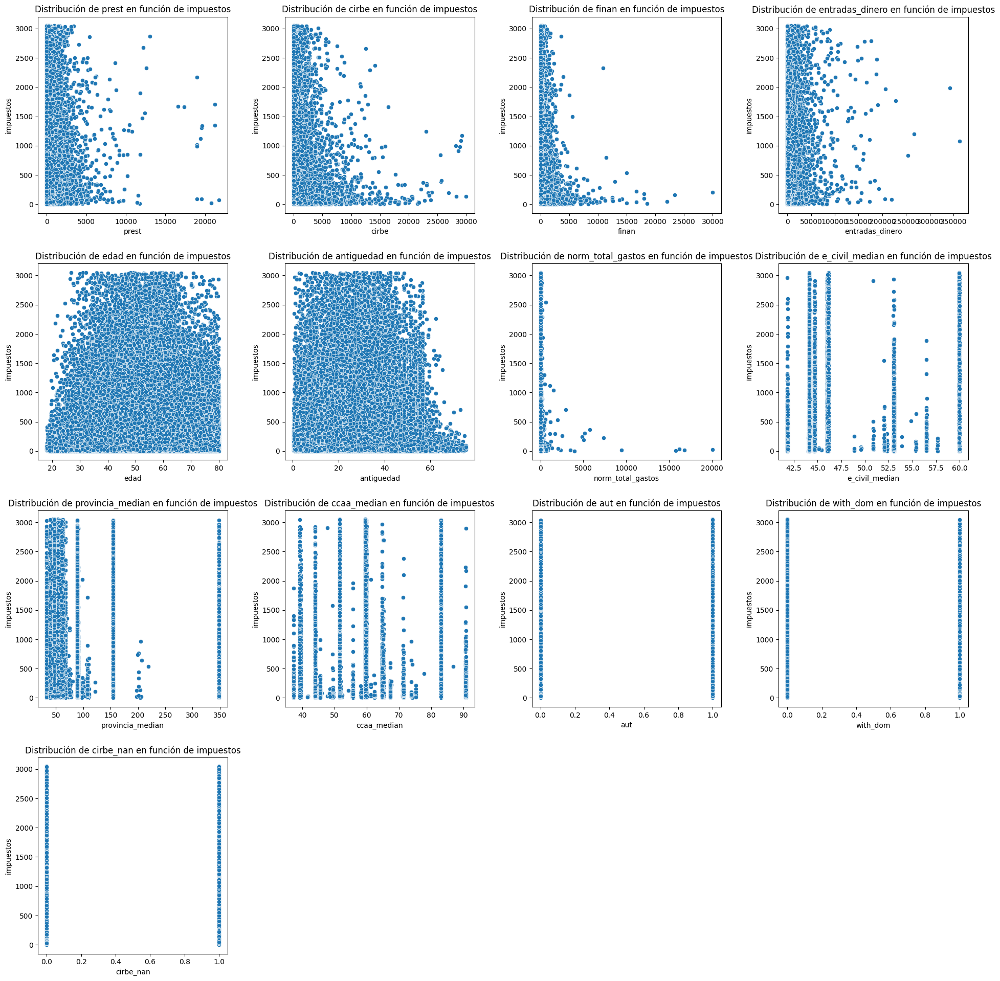

In [51]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['impuestos'] = y_train
df = df_train[df_train['prest'] <= 30000]
df = df[df['cirbe'] <= 30000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 400000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['impuestos'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de impuestos')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('impuestos')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Aunque siguen siendo datos muy difíciles de analizar y predecir, parecen algo mejores que los anteriores, pues aquí podemos ver ligeras relaciones.

## <a id='toc6_2_'></a>[Feature Importance](#toc0_)

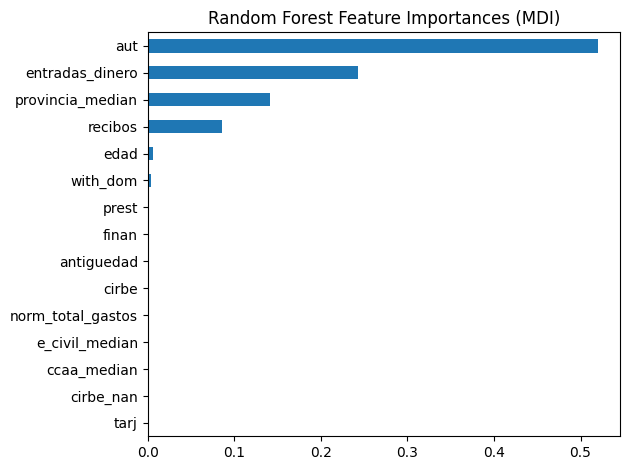

In [52]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

Podemos observar como el modelo predice principalmente en función de si es autónomo o no, de las entradas de dinero, de la provincia y de los recibos.

## <a id='toc6_3_'></a>[Permutation Feature Importance](#toc0_)

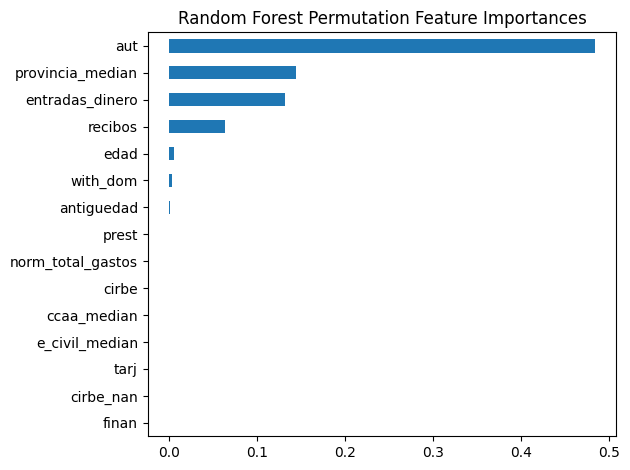

In [53]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Aquí si que parece un resultado mucho más acertado que los anteriores, el modelo predice mucho mejor pues alterar la relación de los datos sí que empeora significativamente el modelo. En particular vemos que la variable autónomo es muy importante para la precisión del modelo.

## <a id='toc6_4_'></a>[PDP](#toc0_)

In [54]:
rf.feature_names_in_

array(['prest', 'recibos', 'tarj', 'cirbe', 'finan', 'entradas_dinero',
       'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median',
       'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'],
      dtype=object)

Variables a estudiar:

- aut --> 12
- provincia_median --> 10
- entradas_dinero --> 5
- recibos --> 1

In [55]:
#X_clean = X_train.copy()
#X_clean['aut'] = X_clean['aut'].apply(lambda x: 0 if x < 0.5 else 1)
#X_clean.describe(include='all')

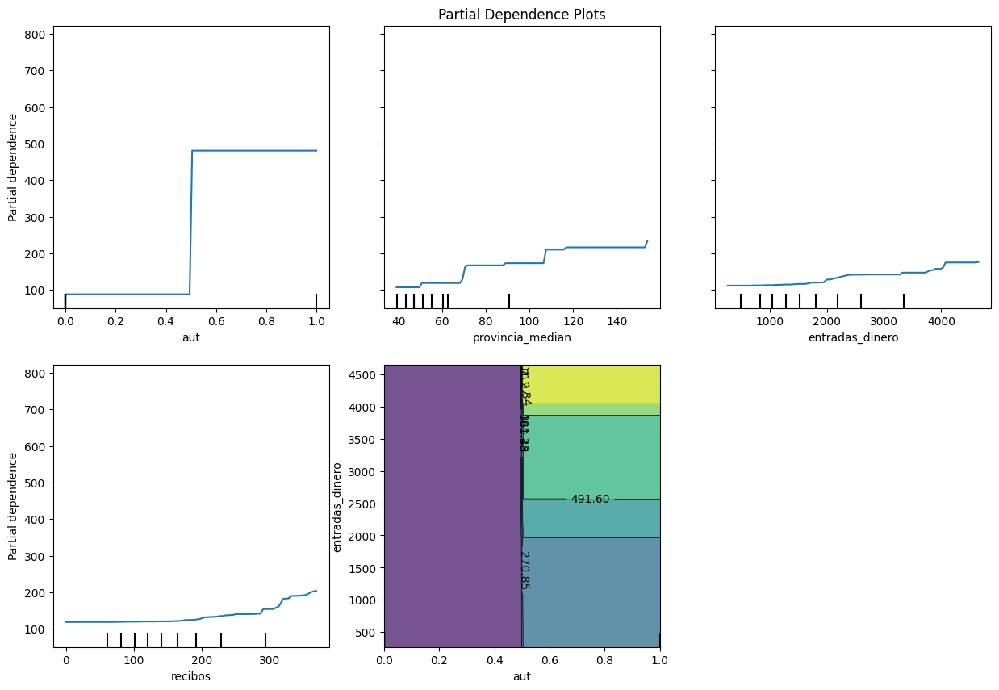

In [56]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(12, 10, 5, 1, (12,5)), # the features to plot
    #categorical_features = [False]*12+[True]+[False]*2, # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Vemos como afectan las variables principales, tras aplicar SHAP vi una clara relación muy importante para entender la predicción entre ser autónomo y la cantidad de dinero que entra. Por eso he añadido el PDP de las dos variables combinadas.

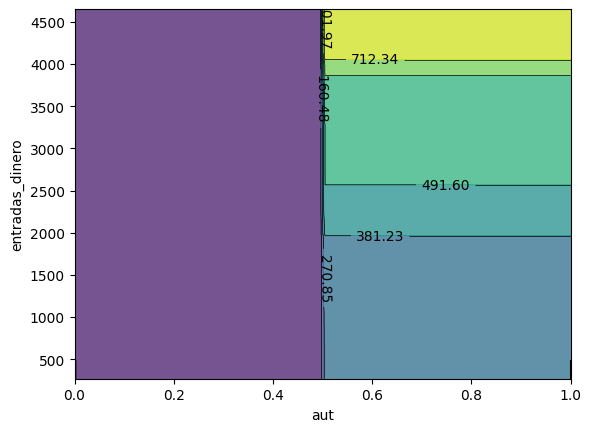

In [57]:
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=[(12, 5)] # los features a graficar
    # categorical_features=[False]*12 + [True] + [False]*2 # features categóricos
)
plt.show()


Hablo más en detalle más adelante.

## <a id='toc6_5_'></a>[SHAP](#toc0_)

In [21]:
shap.initjs()

In [22]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/impuestos_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/impuestos_shap_values.npy', shap_values)

### <a id='toc6_5_1_'></a>[Bar Plot](#toc0_)

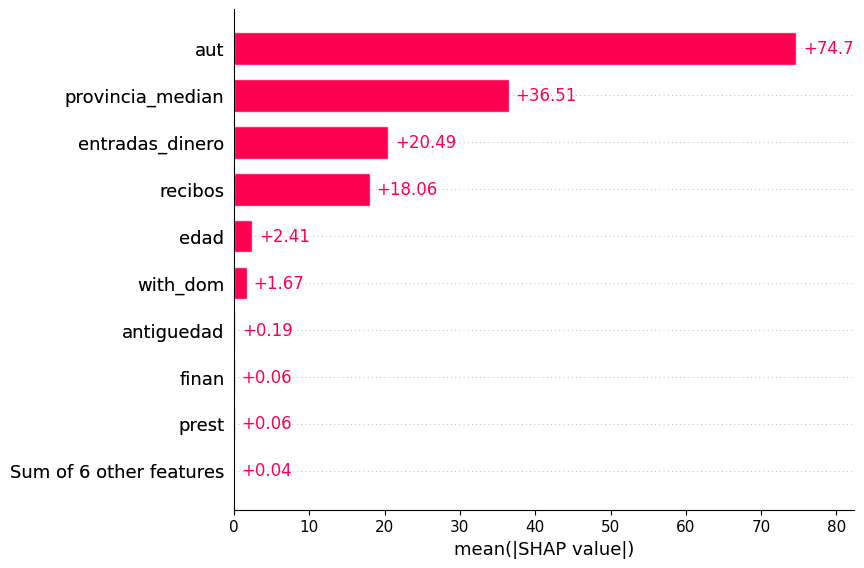

In [23]:
# Crear un objeto Explanation
shap_explanation = shap.Explanation(shap_values, base_values=explainer.expected_value, data=X_test, feature_names=X_test.columns)

# Crear el gráfico de barras
shap.plots.bar(shap_explanation)

Otra vez resultados muy similares a FI y PFI.

### <a id='toc6_5_2_'></a>[Summary Plots](#toc0_)

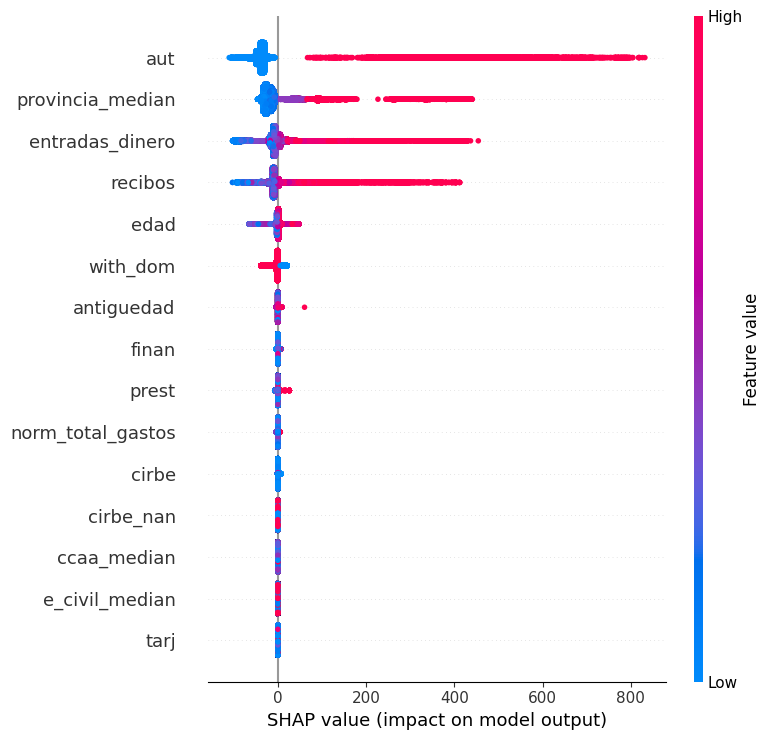

In [60]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Lo principal a comentar es lo siguiente:

- La mayoría de los no autónomos pagan los mismos impuestos y la diferencia en todo el conjunto no es demasiado alta. Sin embargo, ser autónomos aumenta la predicción de la cantidad a pagar y vemos que dentro de los autónomos si hay mucho más rango de variación.
- Para la provincia vemos que hay una gran cantidad de valores que no afectan a penas y luego parece que (lógico al ser una muestra representativa de la provincia) hay una relación clara.
- Para entradas de dinero y recibos es muy similar la intuición, hay cierto cúmulo de valores que el modelo no sabe (dudo que sea que no lo hagan) como afectan (SHAP values 0), pero en general cuanto mayor es el valor mayor es la estimación.

Por tanto la intuición general de como funciona el modelo es a partir de un valor base de los impuestos añade extras según las cuatro variables comentadas (los valores SHAP suelen ser positivos y hay pocos valores negativos).

### <a id='toc6_5_3_'></a>[Force Plots](#toc0_)

In [32]:
#shap.force_plot(explainer.expected_value[0], shap_values, X_test)

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

In [33]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/impuestos_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

En el html de este enlace se puede observar el gráfico resumen de los force plots.

[Force Plot Impuestos](SHAP/impuestos_force_plot.html)

Adjunto a continuación algunas captura para analizar algunas ideas.

![Image](Imagenes/Impuestos/impuestos_SHAP_fp_outVls.png)

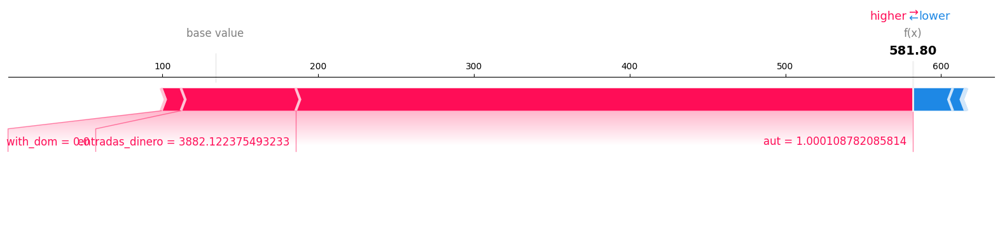

In [34]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[1251]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

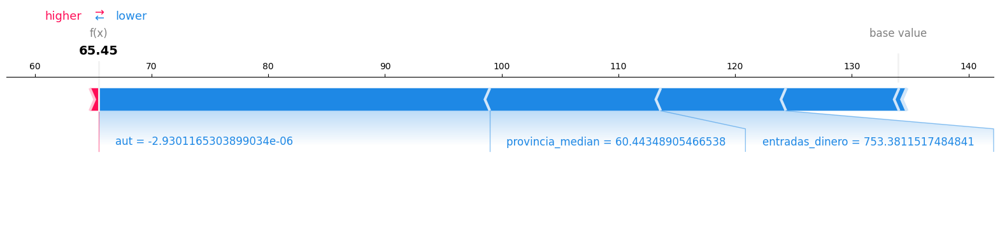

In [35]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[898]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

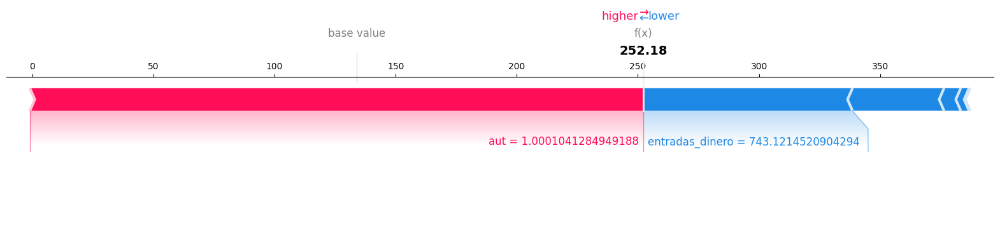

In [36]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[522]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

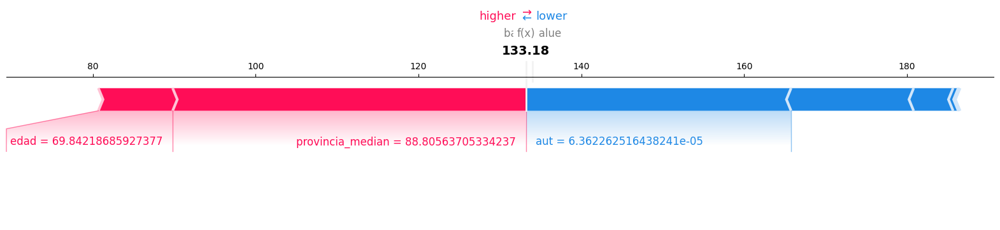

In [40]:
# Obtener el índice original en el conjunto submuestreado
original_index = indices[889]

# Generar el gráfico force plot para el índice específico
shap.force_plot(explainer.expected_value[0], shap_values[original_index], X_test.iloc[original_index], matplotlib=True)

Como comentario general de esto vemos que los SHAP values tienen un valor base de unos 135 y el rango de predicciones está aproximadamente entre [0,1200]. Lo más importante a destacar aquí es lo que ya hemos comentado, la variable autónomo tiene una importancia tremenda para nuestro modelo. Podemos ver en los gráficos que incluso llega prácticamente a ser la única variable con importancia para una predicción y en el gráfico general de los force plots vemos que hay dos regiones claras, esta división se debe en su inmensa mayoría a ser autónomo o no.

### <a id='toc6_5_4_'></a>[Dependence Plots](#toc0_)

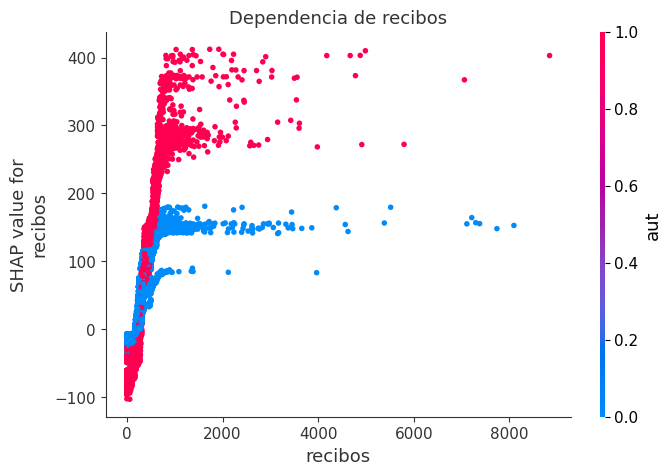

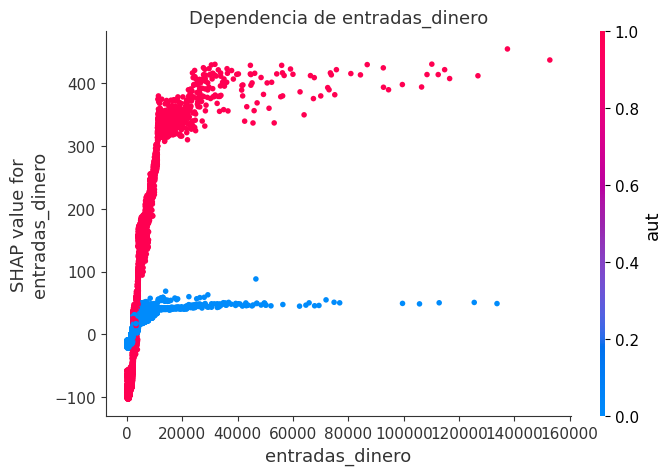

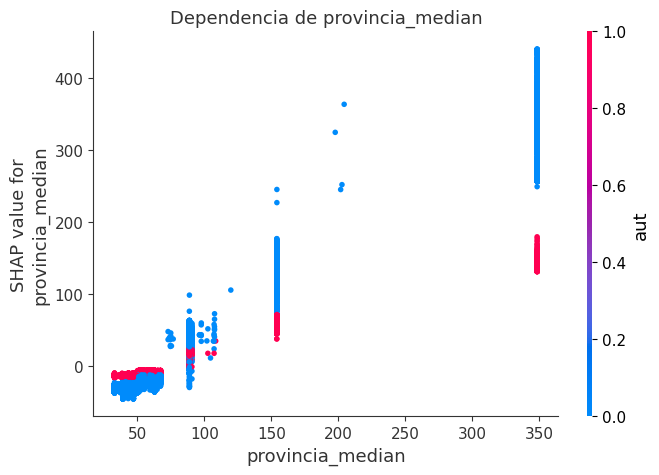

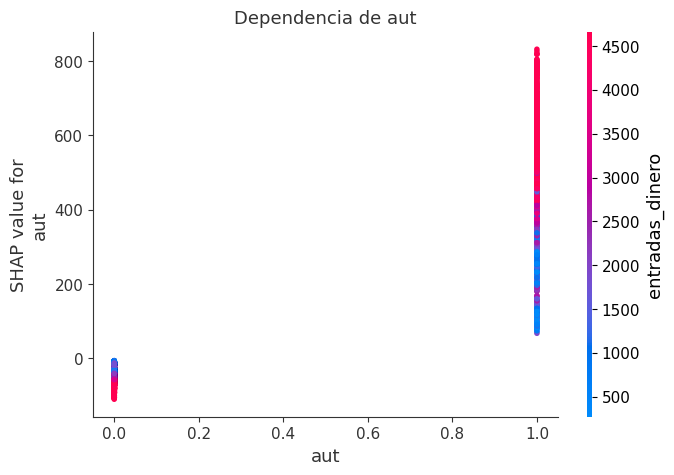

In [63]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['recibos']<10000]
X_clean = X_clean[X_clean['entradas_dinero']<200000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['aut','provincia_median','entradas_dinero','recibos']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

La conclusión general de estos gráficos es que es fácil entender porque ser autónomo es la variable más importante y la que más afecta al modelo, pues los SHAP values de todas las variables importantes se ven afectados por ser autónomo o no. 

# <a id='toc7_'></a>[Resultados Interpretabilidad](#toc0_)

## <a id='toc7_1_'></a>[Interpretabilidad Recibos](#toc0_)

## <a id='toc7_2_'></a>[Interpretabilidad Tarjetas](#toc0_)

## <a id='toc7_3_'></a>[Interpretabilidad Impuestos](#toc0_)

# <a id='toc8_'></a>[Conclusiones](#toc0_)

En este apartado voy a resumir las ideas más importantes que se ven reflejadas en la implementación. La idea no es hablar sobre el análisis específico de los modelos con esta base de datos, sino de los resultados que podemos obtener en cuanto al **uso y capacidades de las técnicas de interpretabilidad**.

Primero debemos empezar comentando que partimos de un problema de regresión muy complicado donde cuesta mucho encontrar relaciones fáciles de interpretar entre las variables que tenemos y el target. Precisamente por esto tenemos interés en usar lo estudiado en este TFG para ser capaces de interpretar aquello que nuestros modelos han sido capaces de abstraer.

Desde hace ya bastante tiempo son habituales ciertas técnicas como lo son el análisis exploratorio de datos (EDA), la importancia de características del random forest (FI) o el Permutation Feature Importance (PFI). En este contexto, para esta implementación se partía de modelos con resultados no suficientemente buenos y sin mayor  interpretabilidad que la obtenida por estas técnicas. Como hemos podido observar al principio de cada modelo, la previsualización de los datos no aporta demasiada claridad y tanto el FI como el PFI solo nos sirven para tener una idea qué características son más importantes, nada más.

A raíz de esto podemos comentar ya la conclusión más importante que hemos obtenido: SHAP es extremadamente útil y **versátil**. Con muy poco esfuerzo SHAP ha sido capaz de darnos más información sobre como funciona el modelo que las tres técnicas comentadas antes. De hecho, incluso Partial Dependence Plot (PDP) puede ser fácilmente mejorada por SHAP. Por un lado SHAP nos ofrece toda la base matemática sobre el reparto justo que hemos discutido previamente en la memoria del TFG, por otro lado se nota que SHAP ha sido desarrollada como una herramienta que pretende condensar y mejorar las técnicas de intrepretabilidad ya existentes en una única librería aprovechando los axiomas de reparto justo de los SHAP values.

Hemos usado los **Bar Plots (BP) de SHAP** que se presentan como una alternativa a las FI más consistente y agnóstica al modelo. Cabe destacar que comparo los Bar Plots de SHAP con las FI, y no directamente con las PFI, pues los BP representan las contribuciones promediadas de los SHAP values. Sin embargo, las PFI están relacionadas con el error del modelo y por tanto dependen de como de bien aproxima nuestro modelo los datos. Es decir, al igual que las FI los BP muestran cómo predice nuestro modelo y lo PFI muestran como afectan las variables a los resultados de nuestro modelo. Aún así, hemos podido observar que, incluso para modelos con malos resultados como estos, los BP sirven perfectamente como sustitutos de los PFI.

Siguiendo con la línea de interpretaciones globales, SHAP ofrece la opción de **Summary Plot** que nos permite visualizar de manera sencilla la distribución de los SHAP values respecto a las variables. Junto a los Dependence Plots que veremos ahora, sirven como una alternativa (mejor) a los PDP, en particular es muy visual el mostrar la distribución de los valores SHAP. Otra posibilidad que ofrece SHAP extremadamente útil y sencilla son los **Dependence Plots**, los cuales nos muestran los SHAP values en función del valor de una variable (muy similar a los PDP) pero con una ventaja muy útil, el uso de colores para representar automáticamente una variable que pueda estar relacionada con el efecto que estamos visualizando.

Finalmente, debemos comentar que SHAP nos ofrece la posibilidad de los **Force Plots**, tanto globales como locales, y precisamente los locales han sido mostrados en la parte teórica de SHAP en la memoria sirviendo como muestra del primer resultado que comentamos de SHAP y la base de todo lo usado, la capacidad de satisfacer los axiomas de Precisión Local, Ausencia y Consistencia.

Quiero terminar resaltando que, en este apartado he hablado de las posibilidades que ofrece SHAP a nivel práctico y no he comentado apenas nada de la base teórica, para esta parte se dispone de la memoria donde se muestran todas las ideas y resultados que permiten a SHAP tener todo el fundamento matemático del que se ha hablado a lo largo de este proyecto.

**Nota final:**

Espero que sirvan, tanto la memoria como esta implementación, para mostrar la importancia de la interpretabilidad hoy en día y las posibilidades que tenemos. Confío en que este proyecto sirva a todo aquel que esté interesado para seguir avanzando en el campo de la interpretabilidad de modelos de clasificación, pues personalmente creo que hay un enorme potencial en este sector y animo a tratar este tema de manera formal para facilitar todo el trabajo que está por venir.

Muchas gracias por llegar hasta aquí.

Gregorio